# Laboratorio 1: Regresión en California

En este laboratorio deben hacer experimentos de regresión con el conjunto de datos "California Housing dataset".

Estudiarán el dataset, harán visualizaciones y seleccionarán atributos relevantes a mano.

Luego, entrenarán y evaluarán diferentes tipos de regresiones, buscando las configuraciones que mejores resultados den.

In [1]:
%pip install statsmodels

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import plotly.express as px
import statsmodels.api as sm


## Carga del Conjunto de Datos

Cargamos el conjunto de datos y vemos su contenido.

In [3]:
from sklearn.datasets import fetch_california_housing
X_california, y_california = fetch_california_housing(return_X_y=True, as_frame=True)
california = fetch_california_housing()

In [4]:
california.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'feature_names', 'DESCR'])

In [5]:
print(california['DESCR'])  # descripción del dataset
#california['feature_names'] # nombres de los atributos para cada columna de 'data'
#california['data']           # matriz con los datos de entrada (atributos)
#print(california['target']) # vector de valores a predecir

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [6]:
california['data'].shape, california['target'].shape

((20640, 8), (20640,))

## División en Entrenamiento y Evaluación

Dividimos aleatoriamente los datos en 80% para entrenamiento y 20% para evaluación:

In [7]:
from sklearn.model_selection import train_test_split
X, y = california['data'], california['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)
X_train.shape, X_test.shape

((16512, 8), (4128, 8))

In [8]:
y.shape

(20640,)

In [9]:
y_test.shape

(4128,)

## Ejercicio 1: Descripción de los Datos y la Tarea

Responda las siguientes preguntas:

**No hace falta escribir código para responder estas preguntas.**

### 1. ¿De qué se trata el conjunto de datos?

 El conjunto de datos "California Housing" se basa en información recopilada de un censo realizado en Estados Unidos en 1990 y tiene información sobre los grupos de bloques en California. Un grupo de bloques es la unidad geográfica más pequeña para la cual la Oficina del Censo de Estados Unidos publica datos de muestra. Por lo general, un grupo de bloques tiene una población de 600 a 3,000 personas.

Cada fila en el conjunto de datos representa un grupo de bloques y contiene información sobre diversas características de ese grupo, como ingreso mediano, edad mediana de las viviendas, número promedio de habitaciones por hogar, número promedio de dormitorios, población del grupo de bloques, número promedio de personas por hogar, latitud y longitud del grupo de bloques.

### 2. ¿Cuál es la variable objetivo que hay que predecir? ¿Qué significado tiene?

La variable objetivo que se debe predecir es el valor mediano de las viviendas en los distritos de California, expresado en cientos de miles de dólares ($100,000). Esta variable representa una medida del valor promedio de las viviendas en un área determinada.

### 3. ¿Qué información (atributos) hay disponibles para hacer la predicción?

Los atributos disponibles para hacer la predicción son:

* MedInc: ingreso mediano en el grupo de bloques.
* HouseAge: edad mediana de las viviendas en el grupo de bloques.
* AveRooms: número promedio de habitaciones por hogar en el grupo de bloques.
* AveBedrms: número promedio de dormitorios por hogar en el grupo de bloques.
* Population: población del grupo de bloques.
* AveOccup: número promedio de personas por hogar en el grupo de bloques.
* Latitude: latitud del grupo de bloques.
* Longitude: longitud del grupo de bloques.

### 4. ¿Qué atributos imagina ud. que serán los más determinantes para la predicción?

A priori, se puede esperar que los atributos más determinantes para la predicción del valor mediano de las viviendas sean el ingreso mediano (MedInc), la edad mediana de las viviendas (HouseAge) y posiblemente la ubicación geográfica (latitud y longitud). Estos atributos suelen estar relacionados con los precios de las viviendas en general.

### 5. ¿Qué problemas observa a priori en el conjunto de datos? ¿Observa posibles sesgos, riesgos, dilemas éticos, etc? Piense que los datos pueden ser utilizados para hacer predicciones futuras.

Algunos posibles problemas o sesgos que se pueden observar a priori en el conjunto de datos son:

* El conjunto de datos se basa en información recopilada en el censo de 1990, lo que significa que puede no reflejar las condiciones y precios actuales de las viviendas en California.
* El conjunto de datos puede contener valores atípicos o datos faltantes que podrían afectar la precisión de los modelos de predicción.
* Dado que los datos se recopilaron utilizando grupos de bloques como unidad geográfica, los resultados pueden no ser representativos a nivel de viviendas individuales.
* Puede que la variable MedInc no refleje la realidad, ya que en este tipo de información suele ocurrir que se aporten datos alterados.

## Ejercicio 2: Visualización de los Datos

In [10]:
california['feature_names']

['MedInc',
 'HouseAge',
 'AveRooms',
 'AveBedrms',
 'Population',
 'AveOccup',
 'Latitude',
 'Longitude']

In [11]:
# Crear un DataFrame con los datos para poder realizar los trabajos de visualizacion 
df = pd.DataFrame(data=california['data'], columns=california['feature_names'])

# Agregar la columna de la variable objetivo
df['Precio'] = california['target']

# Imprimir el DataFrame resultante
df.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Precio
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


### 2.1 Para cada atributo de entrada, haga una gráfica que muestre su relación con la variable objetivo.


In [12]:
y= df.Precio

fig0 = px.scatter(df,df.HouseAge, y,title= 'HouseAge')

# Realizamos el mismo analisis grafico para los demas atributos
fig1 = px.scatter(df,df.MedInc, y,title= "MedInc")

fig2 = px.scatter(df,df.AveRooms, y,title= "AveRooms")

fig3 = px.scatter(df,df.AveBedrms, y,title= "AveBedrms")

fig4 = px.scatter(df,df.Population, y,title= "Population")

fig5 = px.scatter(df,df.AveOccup, y,title= "AveOccup")

fig6 = px.scatter(df,df.Latitude, y,title= "Latitude")

fig7 = px.scatter(df,df.Longitude, y,title= "Longitude")

In [13]:
# Mostrar los gráficos
fig0.show() # HouseAge vs precio: A simple vista no se puede encontrar una relacion entre la antiguedad de la vivienda y su precio.

fig1.show() # MedInc: se puede ver una relacion positiva entre la media de ingreso del grupo y el precio de la vivienda, se sospecha que si en el barrio la media de ingresos es alta, los precios de la vivienda tabién los seran.

fig2.show() # AveRooms: a priori vemos outliers con 141 habitaciones, por lo que limitaremos a 15 para el análisis visual
fig22 = px.scatter(df, x='AveRooms', y='Precio',title='AveRooms<15', range_x=[0, 15],range_y=[0, 6],trendline='ols')
fig22.show() #AveRooms<15: se puede ver una pequeña tendencia de relacion positiva pero no es muy marcada

fig3.show() # AveBedrms: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 15 para el análisis visual
fig32 = px.scatter(df, x='AveBedrms', y='Precio',title='AveBedrms<15', range_x=[0, 15],range_y=[0, 6],trendline='ols')
fig32.show() #AveBedrms<15: se puede ver una pequeña tendencia de relacion negativa pero no es muy marcada

fig4.show() # Population: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 600 - 3000 porque es el limite que dice que tiene, para el análisis visual
fig42 = px.scatter(df, x='Population', y='Precio',title='Population<3000', range_x=[600, 3000],range_y=[0, 6],trendline='ols')
fig42.show() #Population<20000: se puede ver una pequeña tendencia de relacion negativa pero no es muy marcada

fig5.show() # AveOccup: a priori vemos outliers que no nos permiten visualizar, por lo que limitaremos a 10 para el análisis visual
fig52 = px.scatter(df, x='AveOccup', y='Precio',title='AveOccup<10', range_x=[0, 10],range_y=[0, 6],trendline='ols')
fig52.show() #AveOccup<10: no se puede ver tendencia a simple vista

fig6.show() #Laitud
fig7.show() #Longitud 

# En cuanto a estas dos ultimas se ve que hay areas con mas variaciones de precios pero es mejor verlo en un mapa, mas adelante.


In [14]:
fig8 = px.scatter_mapbox(df, lat='Latitude', lon='Longitude', color='Precio',
                        mapbox_style='open-street-map', zoom=4,title='Mapa de precios de casas')


fig8.show() # Como se puede ver en el mapa mientras mas se acerca a la costa matores son los precios.


### 2.2 Estudie las gráficas, identificando **a ojo** los atributos que a su criterio sean los más informativos para la predicción.


Estudiando las gráficas, identificamos los atributos que consideramos más informativos para la predicción. A continuación, se presenta una breve descripción de cada atributo:

HouseAge (Edad de las viviendas): A simple vista, no se puede encontrar una relación clara entre la antigüedad de la vivienda y su precio.

MedInc (Ingreso medio): Se puede observar una relación positiva entre el ingreso medio del grupo y el precio de la vivienda. Se sospecha que si en el barrio la media de ingresos es alta, los precios de las viviendas también lo serán.

AveRooms (Número promedio de habitaciones): Al limitar el análisis visual a un máximo de 15 habitaciones, se puede apreciar una pequeña tendencia de relación positiva, aunque no es muy marcada.

AveBedrms (Número promedio de dormitorios): Al limitar el análisis visual a un máximo de 15 dormitorios, se puede observar una pequeña tendencia de relación negativa, aunque no es muy marcada.

Population (Población): Al limitar el análisis visual en el rango de 600 a 3000, se aprecia una pequeña tendencia de relación negativa, pero no es muy marcada.

AveOccup (Número promedio de miembros por hogar): Al limitar el análisis visual a un máximo de 10 miembros por hogar, no se puede observar una tendencia clara.

Latitude (Latitud): No se identifica una relación directa con el precio de las viviendas en la primera grafica.

Longitude (Longitud): No se identifica una relación directa con el precio de las viviendas en la primera grafica.

Además, al observar el mapa de precios de casas en función de la latitud y longitud, se puede notar que los precios tienden a ser más altos a medida que nos acercamos a la costa.

### 2.3 Para ud., ¿cuáles son esos atributos? Lístelos en orden de importancia.

Según nuestra evaluación, los atributos más informativos para la predicción, en orden de importancia, son:

+ MedInc (Ingreso medio)

+ AveRooms (Número promedio de habitaciones)
+ AveBedrms (Número promedio de dormitorios)
+ Population (Población)
+ HouseAge (Edad de las viviendas)
+ AveOccup (Número promedio de miembros por hogar)
+ Distancia a la costa, pero esta no esta como variable en si misma, habría que generarla

Estos atributos muestran cierta relación con el precio de las casas, aunque es importante tener en cuenta que la fuerza de la relación puede variar y no es determinante únicamente basándose en la observación visual. Es recomendable realizar un análisis más profundo y utilizar técnicas de aprendizaje automático para evaluar la verdadera importancia de los atributos en la predicción del precio de las viviendas.


## Ejercicio 3: Regresión Lineal

**Observación:** Con algunos atributos se puede obtener un error en test menor a 50.

### 3.1 Seleccione **un solo atributo** que considere puede ser el más apropiado.

In [15]:
# Paso 1: Seleccionar el atributo MedInc como el más apropiado

X = df[['MedInc']]  # Variable predictora
y = df['Precio']  # Variable objetivo

# Convertir X y y a arreglos NumPy
X = X.to_numpy()
y = y.to_numpy()

#X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

X_train.shape, X_test.shape

((16512, 8), (4128, 8))

In [16]:
feature = 'MedInc'  # selecciono el atributo 'MedInc'
#selector = california['feature_names'].index(feature)
selector = (np.array(california['feature_names']) ==  feature)
X_train_f = X_train[:, selector]
X_test_f = X_test[:, selector]
X_train_f.shape, X_test_f.shape

((16512, 1), (4128, 1))

### 3.2 Instancie una regresión lineal de **scikit-learn**, y entrénela usando sólo el atributo seleccionado.

In [17]:
# Paso 2: Instanciar y entrenar la regresión lineal
from sklearn.linear_model import LinearRegression
reg = LinearRegression()
reg.fit(X_train_f, y_train)

LinearRegression()

### 3.3 Evalúe, calculando error cuadrático medio para los conjuntos de entrenamiento y evaluación.

In [18]:
# Paso 3: Calcular el error cuadrático medio para entrenamiento y evaluación
from sklearn.metrics import mean_squared_error

y_train_pred = reg.predict(X_train_f)
mse_train = mean_squared_error(y_train, y_train_pred)

y_test_pred = reg.predict(X_test_f)
mse_test = mean_squared_error(y_test, y_test_pred)

print("Error cuadrático medio (Entrenamiento):", mse_train)
print("Error cuadrático medio (Evaluación):", mse_test)

Error cuadrático medio (Entrenamiento): 0.6960681099171514
Error cuadrático medio (Evaluación): 0.7214982234014607


### 3.4 Grafique el modelo resultante, junto con los puntos de entrenamiento y evaluación.

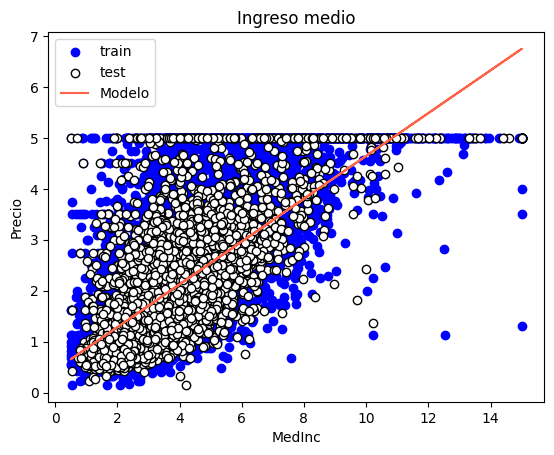

In [19]:
# Paso 4: Graficar el modelo y los puntos de entrenamiento y evaluación
import matplotlib.pyplot as plt
X1 = df[['MedInc']]

plt.scatter(X_train_f, y_train, color='blue', label='train')
plt.scatter(X_test_f, y_test, color='white',edgecolor="k", label='test')
plt.plot(X1.to_numpy(), reg.predict(X1), color='tomato', label='Modelo')
plt.xlabel('MedInc')
plt.ylabel('Precio')
plt.title("Ingreso medio")
plt.legend()
plt.show()

### 3.5 Interprete el resultado, haciendo algún comentario sobre las cualidades del modelo obtenido.

El modelo de regresión lineal muestra un error cuadrático medio (MSE) de 0.69 en el conjunto de entrenamiento y 0.72 en el conjunto de evaluación. Esto indica que el modelo no tiene un buen ajuste a los datos tanto en el conjunto de entrenamiento como en el de evaluación.

En la gráfica, se observa que la línea de regresión sigue la tendencia de los datos. Esto sugiere que el modelo es capaz de capturar la relación general entre la variable predictora (MedInc) y la variable objetivo (Precio). La tendencia ascendente de la línea de regresión indica que a medida que aumenta el ingreso medio en el grupo de bloques, se tiende a observar precios más altos de las viviendas.

En resumen, el modelo de regresión lineal con la variable predictora MedInc no parece ser una buena elección para predecir los precios de las viviendas. Pero tiene concordancia entre la línea de regresión y los datos sugieren un buen ajuste del modelo a los datos disponibles.

## Ejercicio 4: Regresión Polinomial

En este ejercicio deben entrenar regresiones polinomiales de diferente complejidad, siempre usando **scikit-learn**.

Deben usar **el mismo atributo** seleccionado para el ejercicio anterior.

**Observación:** Con algunos atributos se pueden obtener errores en test menores a 40 e incluso a 35.

### 4.1. Para varios grados de polinomio, haga lo siguiente:
    1. Instancie y entrene una regresión polinomial.
    2. Prediga y calcule error en entrenamiento y evaluación. Imprima los valores.
    3. Guarde los errores en una lista.

In [20]:
feature = 'MedInc'  # selecciono el atributo 'MedInc'
#selector = california['feature_names'].index(feature)
selector = (np.array(california['feature_names']) ==  feature)
X_train_f = X_train[:, selector]
X_test_f = X_test[:, selector]
X_train_f.shape, X_test_f.shape

((16512, 1), (4128, 1))

Notamos que los datos ya tienen forma de vector, lo cual es necesario para esta clase de regresiones

In [21]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

degrees = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 60, 80, 100]  # Lista de grados a probar
#Listas para guardar los errores
train_errors = []
val_errors = []

#Modelos
for degree in degrees:
    pf = PolynomialFeatures(degree)
    lr = LinearRegression(fit_intercept=False)  # el bias ya esta como feature
    model = make_pipeline(pf, lr)
    model.fit(X_train_f, y_train) #Entrenamiento
    y_train_pred = model.predict(X_train_f) #Prediccion
    y_test_pred = model.predict(X_test_f)
    train_error = mean_squared_error(y_train, y_train_pred) #Errores
    test_error = mean_squared_error(y_test, y_test_pred)
    train_errors.append(train_error)
    val_errors.append(test_error)
    print(f'Train error para grado {degree} es: {train_error:0.2}')
    print(f'Test error para grado {degree} es: {test_error:0.2}')

Train error para grado 0 es: 1.3
Test error para grado 0 es: 1.3
Train error para grado 1 es: 0.7
Test error para grado 1 es: 0.72
Train error para grado 2 es: 0.69
Test error para grado 2 es: 0.72
Train error para grado 3 es: 0.68
Test error para grado 3 es: 0.71
Train error para grado 4 es: 0.68
Test error para grado 4 es: 0.71
Train error para grado 5 es: 0.68
Test error para grado 5 es: 0.71
Train error para grado 6 es: 0.68
Test error para grado 6 es: 0.71
Train error para grado 7 es: 0.67
Test error para grado 7 es: 0.7
Train error para grado 8 es: 0.67
Test error para grado 8 es: 0.7
Train error para grado 9 es: 0.67
Test error para grado 9 es: 0.7
Train error para grado 10 es: 0.67
Test error para grado 10 es: 0.7
Train error para grado 20 es: 3.2
Test error para grado 20 es: 3.2
Train error para grado 30 es: 5.1
Test error para grado 30 es: 5.1
Train error para grado 40 es: 5.4
Test error para grado 40 es: 5.4
Train error para grado 60 es: 5.5
Test error para grado 60 es: 6.6


In [22]:
#Lista de errores
train_errors, val_errors

([1.3383715004003638,
  0.6960681099171515,
  0.6894859202345499,
  0.6782140838210796,
  0.6780518857896085,
  0.6780050101806555,
  0.6760874470470535,
  0.6737153167658606,
  0.673552528024595,
  0.6735503011667089,
  0.6733338218101343,
  3.1576669603801037,
  5.058004884720247,
  5.384151382918309,
  5.495835986544731,
  5.536412602770289,
  5.547651222966542],
 [1.3043431479307854,
  0.7214982234014607,
  0.717407420592355,
  0.7081355393674346,
  0.7080431289121548,
  0.7079724319207127,
  0.7067678778886791,
  0.7025961077696538,
  0.7021037655189682,
  0.7020731280289471,
  0.7023994827870073,
  3.170013934182579,
  5.079083549140195,
  5.429521269500444,
  6.577709612846729,
  7.815578517931003,
  34.75726033313583])

### 4.2 Grafique las curvas de error en términos del grado del polinomio.

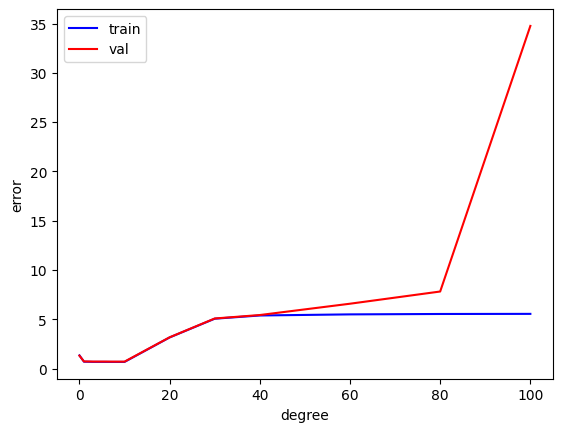

In [23]:
plt.plot(degrees, train_errors, color="blue", label="train")
plt.plot(degrees, val_errors, color="red", label="val")
plt.legend()
plt.xlabel("degree")
plt.ylabel("error")
plt.show()

Como no se alcanza a ver bien el punto donde comienza el sobreajuste vamos a hacer zoom sobre la zona del principio

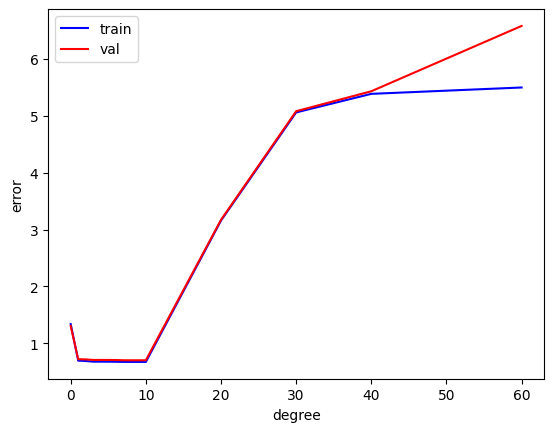

In [24]:
plt.plot(degrees[:15], train_errors[:15], color="blue", label="train")
plt.plot(degrees[:15], val_errors[:15], color="red", label="val")
plt.legend()
plt.xlabel("degree")
plt.ylabel("error")
plt.show()

### 4.3 Interprete la curva, identificando el punto en que comienza a haber sobreajuste, si lo hay.

Podemos observar que aproximadamente a partir del grado 40 comienza el sobreajuste, ya que el error en evaluación empieza a subir. De todas formas parece mostrar que los modelos tienen alto grado de error.

### 4.4 Seleccione el modelo que mejor funcione, y grafique el modelo conjuntamente con los puntos.

In [25]:
degree = 7
model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
model.fit(X_train_f, y_train)

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures(degree=7)),
                ('linearregression', LinearRegression())])

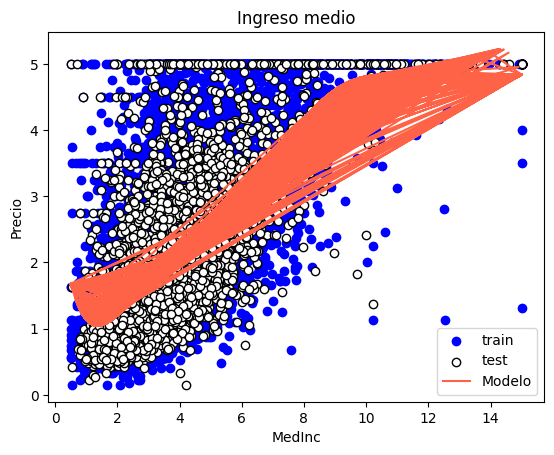

In [27]:
plt.scatter(X_train_f, y_train, color='blue', label='train')
plt.scatter(X_test_f, y_test, color='white',edgecolor="k", label='test')
plt.plot(X1.to_numpy(), model.predict(X1), color='tomato', label='Modelo')
plt.xlabel('MedInc')
plt.ylabel('Precio')
plt.title("Ingreso medio")
plt.legend()
plt.show()

### 4.5 Interprete el resultado, haciendo algún comentario sobre las cualidades del modelo obtenido.

El modelo de regresión polinomial de grado 7 muestra un error cuadrático medio (MSE) de 0.67 en el conjunto de entrenamiento y 0.70 en el conjunto de evaluación. Performa apenas mejor que la relacion lineal pero sigue indicando que el modelo no tiene un buen ajuste a los datos tanto en el conjunto de entrenamiento como en el de evaluación.

## Ejercicio 5: Regresión con más de un Atributo

En este ejercicio deben entrenar regresiones que toman más de un atributo de entrada.

### 5.1 Seleccione **dos o tres atributos** entre los más relevantes encontrados en el ejercicio 2.

In [28]:
#Seleccionar los atributos mas relevantes

X = df[['MedInc', 'HouseAge', 'AveRooms']]  # Variable predictora
y = df['Precio']  # Variable objetivo

# Convertir X y y a arreglos NumPy
X = X.to_numpy()
y = y.to_numpy()

#X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=0)

X_train.shape, X_test.shape

((16512, 8), (4128, 8))

In [32]:

selector = (np.array(california['feature_names']) == 'HouseAge') | (np.array(california['feature_names']) == 'AveRooms') | (np.array(california['feature_names']) == 'MedInc')

X_train_fs = X_train[:, selector]
X_test_fs = X_test[:, selector]
X_train_fs.shape, X_test_fs.shape

((16512, 3), (4128, 3))

### 5.2 Repita el ejercicio anterior, pero usando los atributos seleccionados. No hace falta graficar el modelo final.

In [33]:
degrees = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]  # Lista de grados a probar
#Listas para guardar los errores
train_errors = []
val_errors = []

#Modelos
for degree in degrees:
    pf = PolynomialFeatures(degree)
    lr = LinearRegression(fit_intercept=False)  # el bias ya esta como feature
    model = make_pipeline(pf, lr)
    model.fit(X_train_fs, y_train) #Entrenamiento
    y_train_pred = model.predict(X_train_fs) #Prediccion
    y_test_pred = model.predict(X_test_fs)
    train_error = mean_squared_error(y_train, y_train_pred) #Errores
    test_error = mean_squared_error(y_test, y_test_pred)
    train_errors.append(train_error)
    val_errors.append(test_error)
    print(f'Train error para grado {degree} es: {train_error:0.2}')
    print(f'Test error para grado {degree} es: {test_error:0.2}')

Train error para grado 0 es: 1.3
Test error para grado 0 es: 1.3
Train error para grado 1 es: 0.65
Test error para grado 1 es: 0.67
Train error para grado 2 es: 0.61
Test error para grado 2 es: 0.64
Train error para grado 3 es: 0.57
Test error para grado 3 es: 0.59
Train error para grado 4 es: 0.55
Test error para grado 4 es: 0.57
Train error para grado 5 es: 0.54
Test error para grado 5 es: 0.62
Train error para grado 6 es: 0.54
Test error para grado 6 es: 0.71
Train error para grado 7 es: 0.53
Test error para grado 7 es: 1e+01
Train error para grado 8 es: 7.2
Test error para grado 8 es: 1.8e+04
Train error para grado 9 es: 9.8
Test error para grado 9 es: 8.2e+04
Train error para grado 10 es: 1.6e+01
Test error para grado 10 es: 1.5e+06


In [34]:
#Lista de errores
train_errors, val_errors

([1.3383715004003638,
  0.6453089652908112,
  0.6117392503213287,
  0.5694949724241235,
  0.5514742695858011,
  0.5421842364085667,
  0.5362347252901214,
  0.5292491246752394,
  7.161535171498538,
  9.771676266576037,
  15.524425838877354],
 [1.3043431479307854,
  0.6672960022809673,
  0.6355709317771806,
  0.586590039003953,
  0.5702788790828907,
  0.6184408387393747,
  0.707601750393313,
  10.287425252128193,
  17605.457258025155,
  81501.37994011708,
  1546619.774169698])

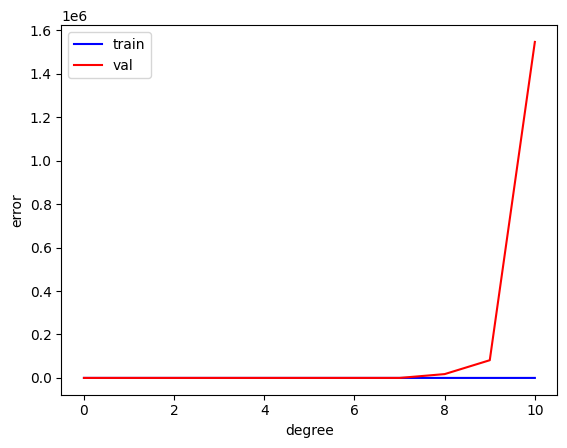

In [35]:
plt.plot(degrees, train_errors, color="blue", label="train")
plt.plot(degrees, val_errors, color="red", label="val")
plt.legend()
plt.xlabel("degree")
plt.ylabel("error")
plt.show()

### 5.3 Interprete el resultado y compare con los ejercicios anteriores. ¿Se obtuvieron mejores modelos? ¿Porqué?

El modelo de regresión polinomica de grado 4 (que se observa es el que menor error de testeo tuvo) muestra un error cuadrático medio (MSE) de 0.54 en el conjunto de entrenamiento y 0.53 en el conjunto de evaluación. Esto indica que el modelo mejoro su ajuste a los datos tanto en el conjunto de entrenamiento como en el de evaluación, aunque sigue sin ser muy bueno.

Se obtuvieron en general mejores modelos porque se pudo explicar la variable target con mas variables que permitieron adaptarse de una mejor manera a la variacion en los precios y por lo tanto reducir el error cuadratico.

## Más ejercicios (opcionales)

### Ejercicio 6: A Todo Feature

Entrene y evalúe regresiones pero utilizando todos los atributos de entrada (va a andar mucho más lento). Estudie los resultados.

### Ejercicio 7: Regularización

Entrene y evalúe regresiones con regularización "ridge". Deberá probar distintos valores de "alpha" (fuerza de la regularización). ¿Mejoran los resultados?
